# Рынок заведений общественного питания Москвы

задание https://practicum.yandex.ru/trainer/data-analyst/lesson/ffa90f15-ac8a-4b42-a044-06880a55dc55/


Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. В распоряжении у нас доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Шаг 1. Загрузите данные и изучите общую информацию

In [2]:
#Импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# импортируем карту и хороплет
from folium import Map, Choropleth
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
from IPython.display import display
import plotly.express as px


In [3]:
#Читаем датасет
data=pd.read_csv('/content/drive/MyDrive/csv/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
#Колличество уникальных названий заведений
unique_names = data['name'].nunique()
print('Колличество уникальных названий заведений',unique_names)

Колличество уникальных названий заведений 5614


В дата сете предсталена информация о 5614 уникальных названиях заведеений,всегда строк записей в датасете 8406, разница говорит что у одногоназвания может быть несколько заведений . Имеются пропуски информации часах работы,описаниях цены,среднем чеке,число с оценкой среднего чека,число с оценкой одной чашки капучино,и постадочных мест

НЕкоррктные типы данных в avg_bill должен быть инт, seats должен быть инт

думаю могут быть некорректные данные в price,это больше категорияльная переменная ,либо этот столбец нужно разбить и данные из него вытащить в другой новый столбец,например или диапозон цен или категорию цены вытащить

Шаг 2. Выполните предобработку данных

In [6]:
#Название столбцов выводим
print(data.columns)

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')


In [7]:
#Считаем количество пропусков в каждом столбце
na_number=data.isna().sum()
print(na_number)

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


In [8]:
#Считаем количество дубликатов
duplicated_number=data.duplicated().sum()
print(duplicated_number)

0


Дубликатов в дата сете 0/

Пропуски имеются в:

hours, price, avg_bill,middle_avg_bill (во могом зависит от столбца avg_bill ),middle_coffee_cup (во могом зависит от столбца avg_bill ),seats
возможно не заполнена карточка предприятия или нет данных в форме

Пропоски в data['hours'] оставляем как есть меняем на '

In [9]:
#проверяем неявные дубликаты по совпадению имени заведения и адреса
data.duplicated(subset=['name','address']).sum()


0

In [10]:
#Перестраховываемся и переводим в нижний регистр имена заведений
data['name'] = data['name'].str.lower()
# Ищем неявные дубликаты по имени и по координатам
data.duplicated(subset=['name','lat', 'lng']).sum()

1

In [11]:
#Смотрим кто задублирован
duplicates = data[data.duplicated(subset=['name','lat', 'lng'], keep=False)]
#print(duplicates)
display(duplicates)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [12]:
#Удаляем дубликат
data.drop_duplicates(subset=['name','lat', 'lng'], keep=False, inplace=True)
# Проверяем
data.duplicated(subset=['name','lat', 'lng']).sum()

0

In [13]:
new_data = data.drop_duplicates(subset=['name', 'lat', 'lng'], keep=False)

In [14]:
#заменим Нан на ''
data['hours'] = data['hours'].fillna('')

In [15]:
data['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [16]:
data['avg_bill'].head(20)

0                               NaN
1          Средний счёт:1500–1600 ₽
2            Средний счёт:от 1000 ₽
3     Цена чашки капучино:155–185 ₽
4            Средний счёт:400–600 ₽
5                               NaN
6                Средний счёт:199 ₽
7            Средний счёт:200–300 ₽
8             Средний счёт:от 500 ₽
9          Средний счёт:1000–1200 ₽
10       Цена бокала пива:250–350 ₽
11                              NaN
12               Средний счёт:330 ₽
13                              NaN
14              Средний счёт:1500 ₽
15           Средний счёт:300–500 ₽
16           Средний счёт:140–350 ₽
17           Средний счёт:350–500 ₽
18           Средний счёт:200–300 ₽
19                              NaN
Name: avg_bill, dtype: object

In [17]:
#изучим данные по столбцу
data[data['price'] == 'высокие'][['name','avg_bill','price']].head(20)

,name,avg_bill,price
69,алазанская долина,Средний счёт:1500–2000 ₽,высокие
76,ресторан купец,Средний счёт:2000–2500 ₽,высокие
93,jamamai asian kitchen & bar,Средний счёт:2100 ₽,высокие
264,акбаш,Средний счёт:2000 ₽,высокие
292,волга-волга,Средний счёт:1500–3000 ₽,высокие
293,parkhouse,Средний счёт:2500–3000 ₽,высокие
300,ресторан стейк's,NaN,высокие
303,signora,Средний счёт:2000–3000 ₽,высокие
317,vоdный,Средний счёт:4500–5500 ₽,высокие
339,чайхона № 1,Средний счёт:1500–2000 ₽,высокие


In [18]:
#Создаем столбец street с названиями улиц из столбца с адресом.
data['street'] = data['address'].str.split(', ').str[1]
data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8404, dtype: object

In [19]:
#Добавим столбец с категорей круглосуточно и ежедневно
data['is_24/7'] = data['hours'].str.contains('ежедневно.*круглосуточно', case=False, regex=True).astype(int)
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,0
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,0
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,1
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,1


In [20]:
print(data['is_24/7'].value_counts())
print('почти 10% от всех заведений работают круглосуточно')

0    7674
1     730
Name: is_24/7, dtype: int64
почти 10% от всех заведений работают круглосуточно


Шаг 3. Анализ данных
Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [21]:
print('Уникальных категорий:',data['category'].nunique())
print('Список уникальных категорий:',data['category'].unique())

Уникальных категорий: 8
Список уникальных категорий: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [22]:
#Количество заведений по категорий которые имеем
data.groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               2378
ресторан           2041
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: name, dtype: int64

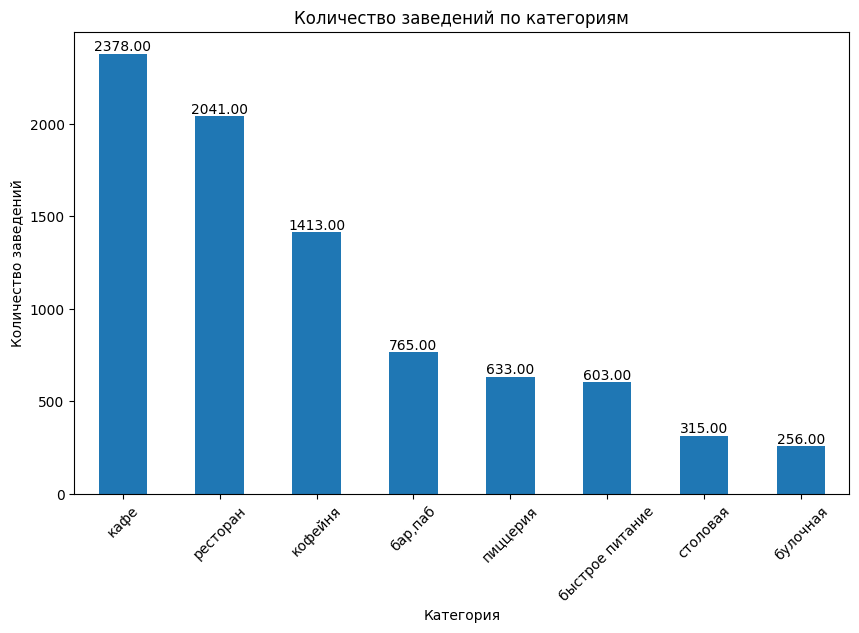

In [23]:
# создаем фигуру с нужным размером
fig, ax = plt.subplots(figsize=(10,6))

# строим столбчатую диаграмму
data.groupby('category')['name'].count().sort_values(ascending=False).plot(kind='bar', ax=ax)

# задаем название графика и осей, а также разворачиваем надписи на оси x
ax.set_title('Количество заведений по категориям')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
ax.tick_params(axis='x', labelrotation=45)

# подписываем значения на каждом столбце
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')



# показываем график
plt.show()

Лидеры категорий по количеству заведений заведениям Кафе 2378, Ресторан 2041,Кофейня 1413

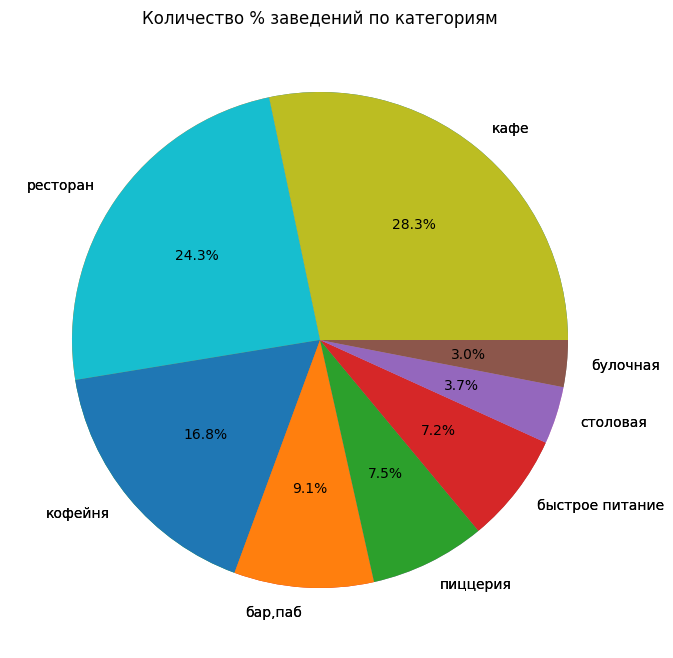

In [24]:
#Выведем % соотношение всех категорий
values=data['category'].value_counts()
labels = values.index.tolist()

fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(values, labels=labels, autopct='%1.1f%%')
ax.axis('equal')

# Создание круговой диаграммы
plt.pie(values, labels=labels)
# задаем название графика и осей, а также разворачиваем надписи на оси x
ax.set_title('Количество % заведений по категориям')

ax.tick_params(axis='x', labelrotation=45)

# Отображение диаграммы
plt.show()

Как видно из круговой диаграммы имеется 2 лидера в категориях общепита это КАФЕ и РЕСТОРАН на 3 месте КОФЕЙНЯ. Аутсайдеры БУЛОЧНЫЕ И СТОЛОВЫЕ

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [25]:
data['seats'].nunique()

229

In [26]:
data['seats'].describe()

count    4793.000000
mean      108.388483
std       122.848265
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

максимальное значение в столбце 'seats' составляет 1288, что значительно превышает третий квартиль (140) и среднее значение (108.42). Таким образом, можно предположить, что это выброс и потенциальная аномалия в данных.

In [27]:
# вычисляем медианы для каждой категории
medians = data.groupby('category')['seats'].median()
print(medians)

category
бар,паб            82.5
булочная           50.0
быстрое питание    65.0
кафе               60.0
кофейня            80.0
пиццерия           55.0
ресторан           86.0
столовая           75.5
Name: seats, dtype: float64


In [28]:
# функция для замены аномалий на медианные значения по категории
def replace_anomalies(row):
    if row['seats'] > 1.5 * medians[row['category']] or row['seats'] == 0:
        return medians[row['category']]
    else:
        return row['seats']

# заменяем аномальные значения на медианные по категории
data['seats'] = data.apply(replace_anomalies, axis=1)

In [29]:
data['seats'].describe()

count    4793.000000
mean       59.804507
std        26.255305
min         1.000000
25%        41.000000
50%        60.000000
75%        80.000000
max       128.000000
Name: seats, dtype: float64

РЕшил все что 0 и все что больше в 1.5раза 3 квартиля аномалии и заменить на медианы по категории

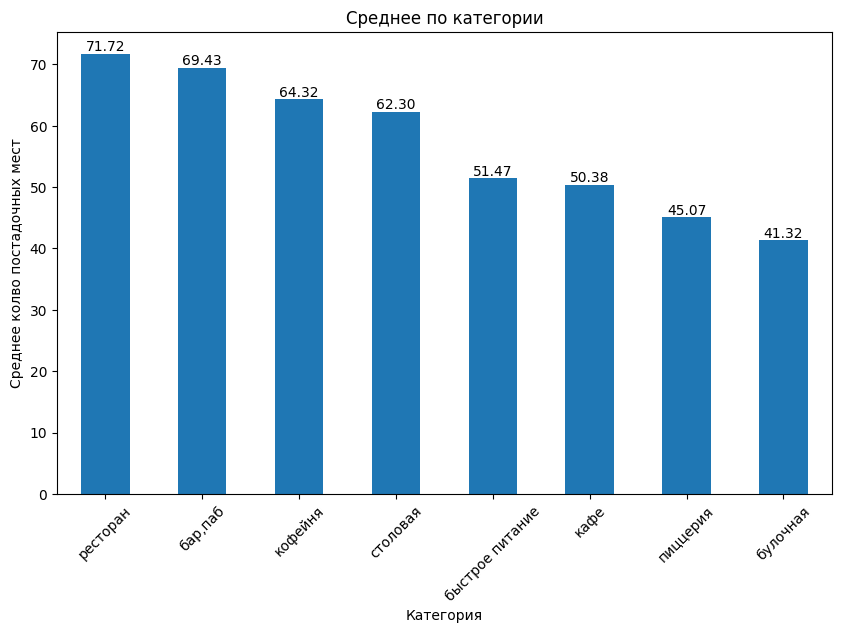

In [30]:
# создаем фигуру с нужным размером
fig, ax = plt.subplots(figsize=(10,6))

# строим столбчатую диаграмму
data.groupby('category')['seats'].mean().sort_values(ascending=False).plot(kind='bar', ax=ax)

# задаем название графика и осей, а также разворачиваем надписи на оси x
ax.set_title('Среднее по категории')
ax.set_xlabel('Категория')
ax.set_ylabel('Среднее колво постадочных мест')
ax.tick_params(axis='x', labelrotation=45)

# подписываем значения на каждом столбце
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')


# показываем график
plt.show()

На 1 месте идет категория РЕСТОРАН,2м БАР ПАБ, 3 и 4 КОФЕЙНЯ и СТОЛОВАЯ, БУЛОЧНАЯ МЕНЬШЕ ВСЕГО МЕСТ

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

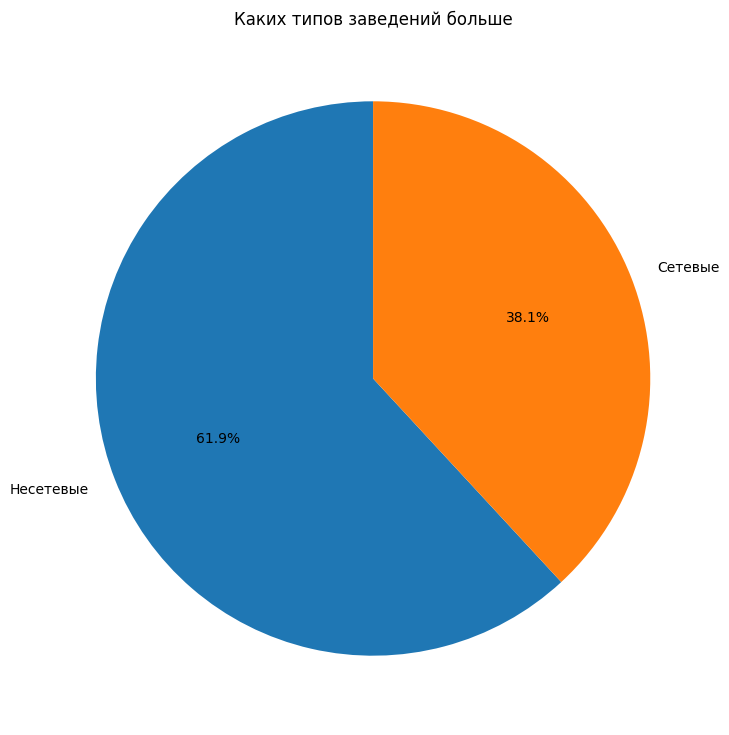

In [31]:
# подсчет количества значений
count = data['chain'].value_counts()

# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(count, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%', startangle=90)
ax.set_title('Каких типов заведений больше')
plt.show()

Больше всего несетевых почти в 2 раза

Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

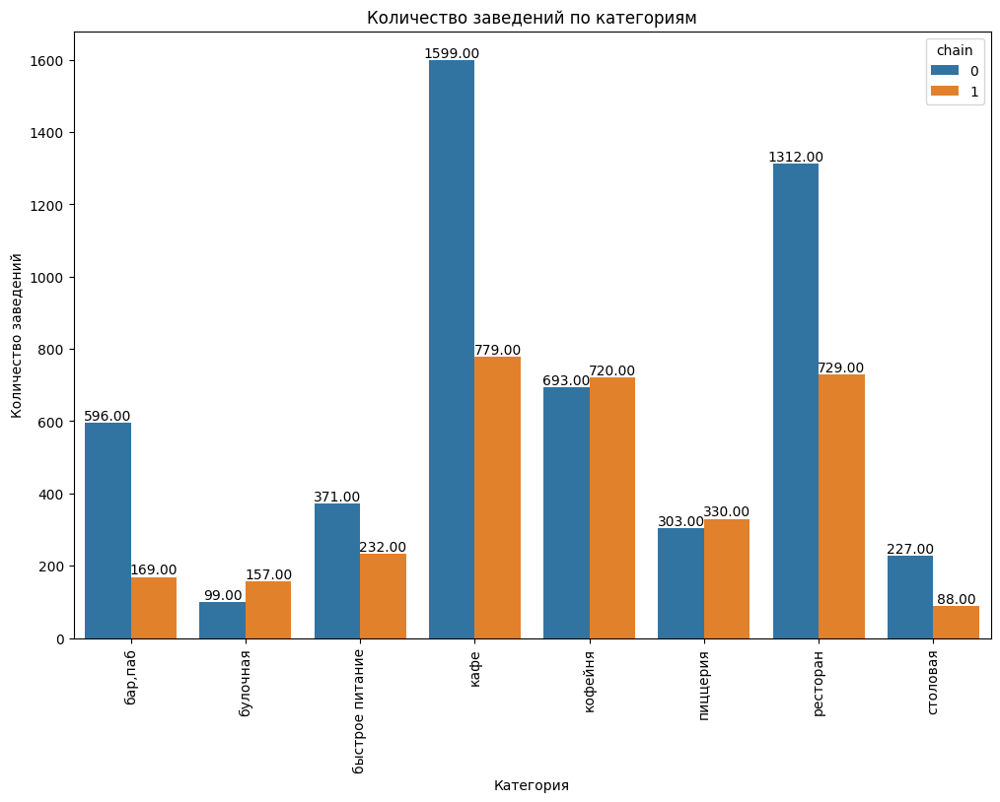

In [32]:
# создаем таблицу с количеством заведений по категориям и сетевым/несетевым заведениям
category_chain_count = data.groupby(['category', 'chain'])['name'].count().reset_index()
category_chain_count.columns = ['category', 'chain', 'count']

fig, ax = plt.subplots(figsize=(12,8))
# создаем барплот, разделяя сетевые и несетевые заведения
sns.barplot(data=category_chain_count, x='category', y='count', hue='chain')

# задаем название графика и осей
ax.set_title('Количество заведений по категориям')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=90)

# подписываем значения на каждом столбце
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')


plt.show()

Больше заведений становятся сетевыми из категорий 1Кафе,2 Кофейня,3Ресторан. Но В кафе доля к не сетевым почти в 2 раза, в то время как в кофейн почти одинаковое количество сетевых к несетевым, даже сетевые преобладают, так же как в пицерии но их очень мало что сетевых что несетевых. А вот булочная значительно преобладает сетевыми заведеними на несетевыми

In [33]:
chain_category_count = data[data['chain'] == 1].groupby('category').size().sort_values(ascending=False).head(15)
chain_category_count

category
кафе               779
ресторан           729
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
dtype: int64

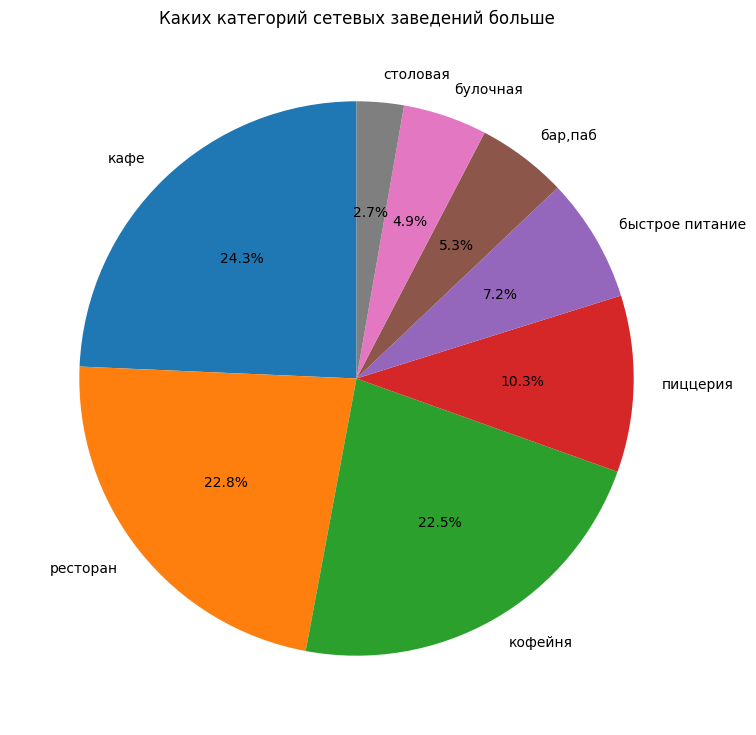

category
кафе               779
ресторан           729
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
dtype: int64


In [34]:
#Каких категорий в сетевых заведений больше
top_chain = chain_category_count
chain_category_labels = top_chain.index.tolist()
# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(top_chain, labels=chain_category_labels, autopct='%1.1f%%', startangle=90)
ax.set_title('Каких категорий сетевых заведений больше')
plt.show()
print(top_chain)

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [35]:
#Создаем столбец street с названиями улиц из столбца с адресом.
data['town'] = data['address'].apply(lambda x: x.split(',')[0].strip())
data[['address','town']].head(20)
data['town'].value_counts()

Москва    8404
Name: town, dtype: int64

Прочитав задание я подумал что может быть и другие города и решил вычлинить город, но по факту все оказалось Москвой, решил не убирать а спросить как в будущем я мог бы это проверять все ли данные из москвы? только так или есть еще какой то более простой метод?

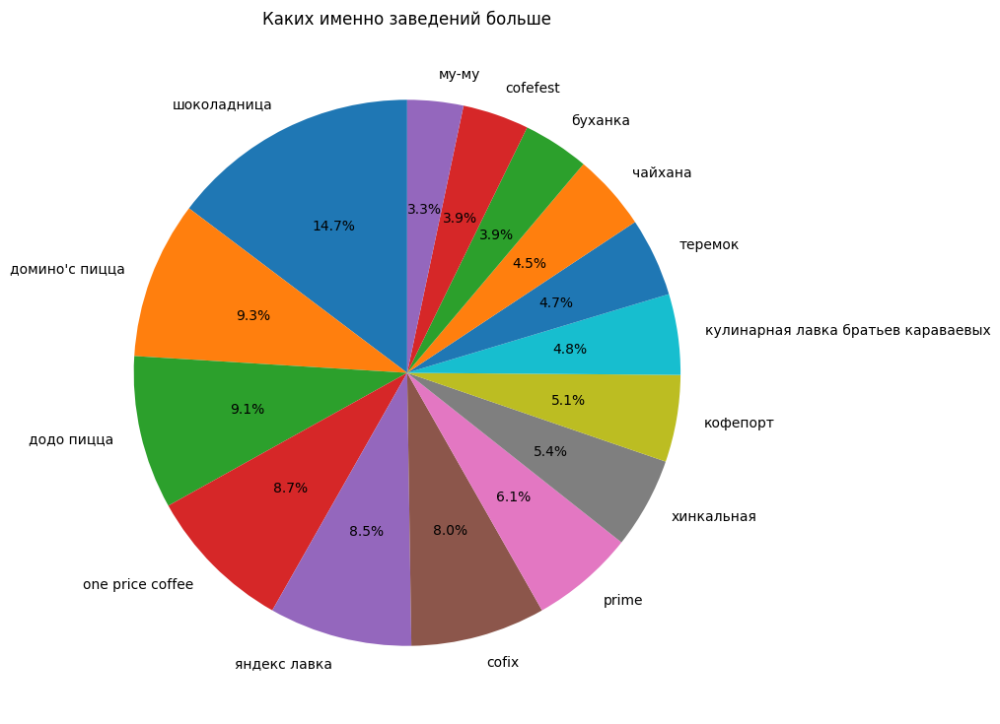

In [36]:
data[data['chain']==1]['name'].value_counts()
# подсчет количества значений
chain_count = data[data['chain']==1]['name'].value_counts().head(15)
chain_labels = chain_count.index.tolist()
# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(chain_count, labels=chain_labels, autopct='%1.1f%%', startangle=90)
ax.set_title('Каких именно заведений больше')
plt.show()

In [37]:
data[data['name']=='шоколадница']['category'].value_counts()

кофейня    119
кафе         1
Name: category, dtype: int64

Как распределены сетевые завеения .1 Шоколадница -кофейня 2 Домино пицца реторан 3Додо Пицца пиццерия Что странно что Домионс в категории ресторан,проверим ниже так ли это? Шоколадница как лидер имеет в себе заведение категории кафе,но это или ошибка или реально новый формат, хотя я думаю 119 кофейня а 1 кафе,скорее всего ошибка, но поскольку процент неверного знаение не велик,можно принебречь и оставить как есть

А так вывод следующий 1 место Шоколадница категория кофеня, 2 и 3 это 2 Пиццерии Домино пицца и Додо пицца соответтвенно Все эти заведения знакомы. Феномен шоколадницы не знаю, а пицерри думаю потому что бум доставок сейчас наблюдается

In [38]:
#px.bar(data, x='name', y='count', color='category')

In [39]:
grouped_data = data.groupby(['name', 'category'])['address'].count()

In [40]:
grouped_data = grouped_data.reset_index().sort_values(by='address', ascending=False).head(15)

In [41]:
# Группировка данных по двум категориям
# grouped_data = data.groupby(['name', 'category'])

# Подсчет количества элементов в каждой группе
# count = grouped_data.size().reset_index(name='count')

# Создание столбчатой диаграммы с разными цветами для каждой группы
fig = px.bar(grouped_data, x='name', y='address', color='category', title='Количество по заведениям и типам')
# подписываем значения на каждом столбце
# for p in ax.patches:
#     ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')


fig.show()

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [42]:
print('Количество районов представелно:',data['district'].nunique())
print('Количество заведений в районе:',data['district'].value_counts())

Количество районов представелно: 9
Количество заведений в районе: Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64


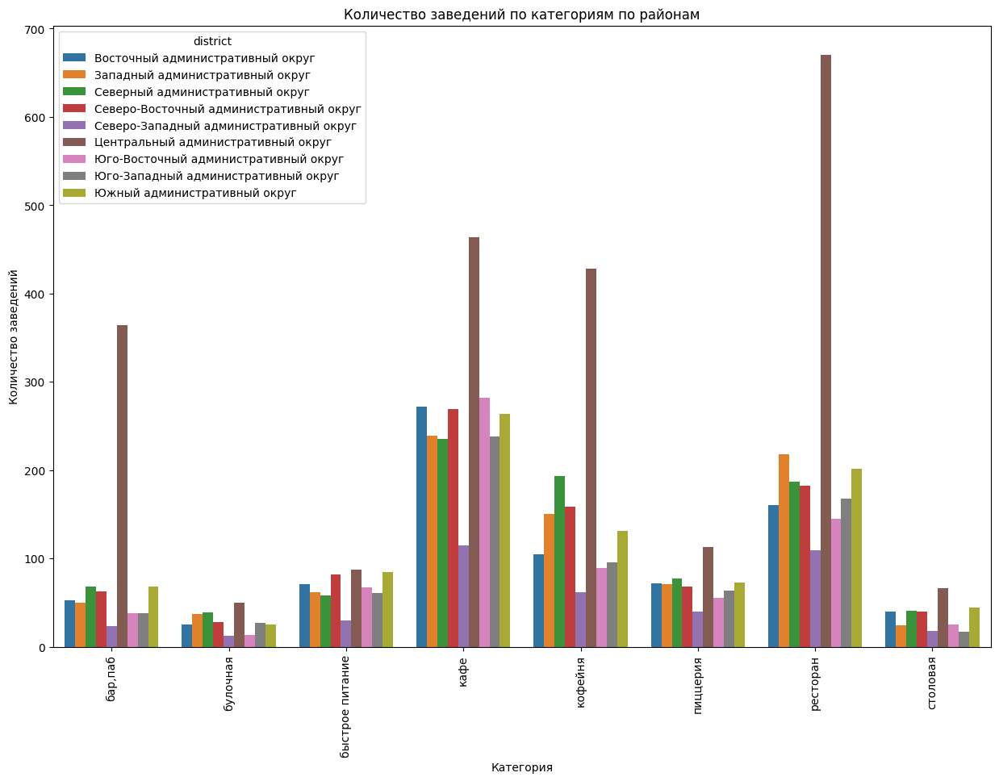

In [43]:
# создаем таблицу с количеством заведений по районам и по категория
district_count = data.groupby(['category', 'district'])['name'].count().reset_index()
district_count.columns = ['category', 'district', 'count']

fig, ax = plt.subplots(figsize=(15,10))
# создаем барплот, разделяя заведения по районам и по категория
sns.barplot(data=district_count, x='category', y='count', hue='district')

# задаем название графика и осей
ax.set_title('Количество заведений по категориям по районам')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=90)

# подписываем значения на каждом столбце
#for p in ax.patches:
#    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')


plt.show()

ЦАО лидирует везде в каждой категории, а сильно вырывается впереде в категориях БАР ,ПАБ КАФЕ КОФЕЙНЯ РЕСТОРАН

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [44]:
# вычисляем средние рейтинги для каждой категории
rating_medians = data.groupby('category')['rating'].mean().sort_values(ascending= False)
print(rating_medians)

category
бар,паб            4.387712
пиццерия           4.301264
ресторан           4.290446
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.123886
быстрое питание    4.050249
Name: rating, dtype: float64


In [45]:
data['rating'].describe()

count    8404.000000
mean        4.229902
std         0.470404
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

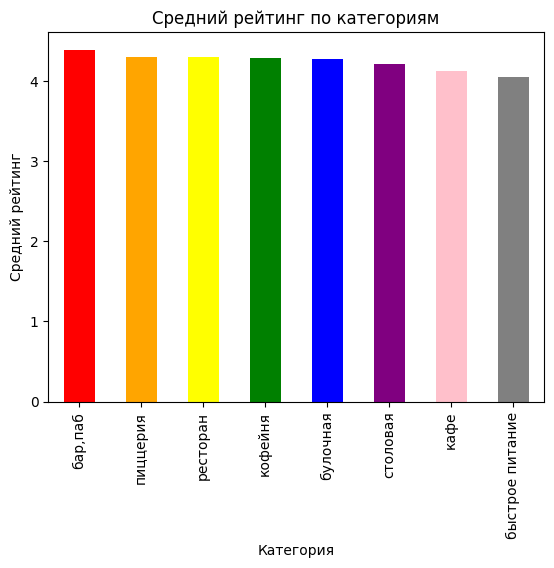

In [46]:
rating_medians.plot.bar(color=['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'pink', 'gray'])
plt.title('Средний рейтинг по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')



plt.show()

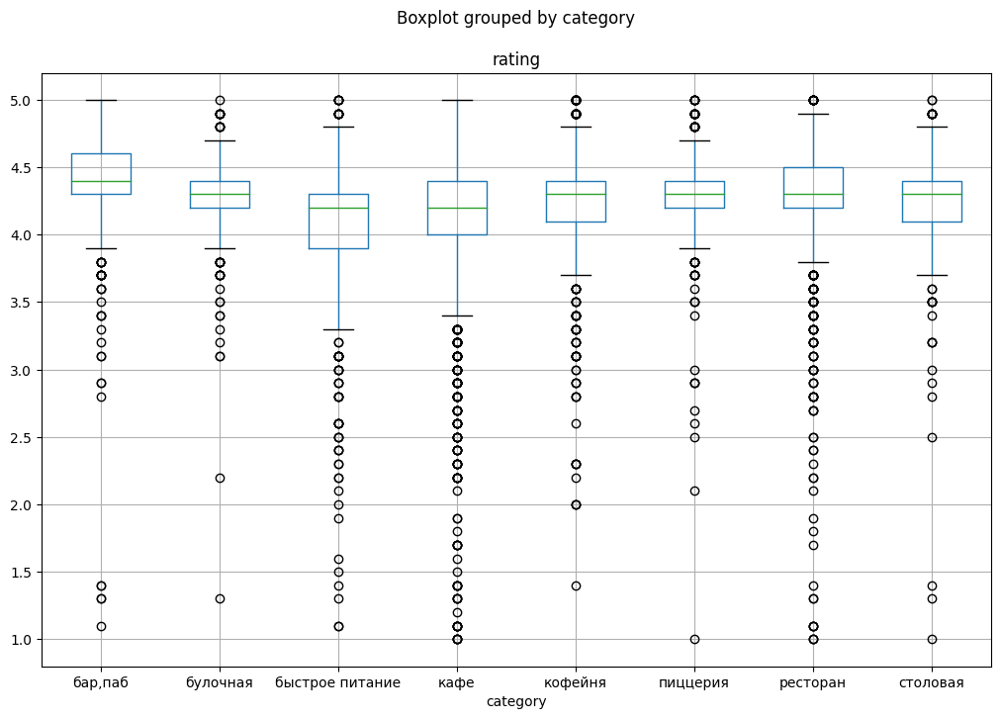

In [47]:
data.boxplot(column='rating', by='category', figsize=(12, 8))
plt.show()

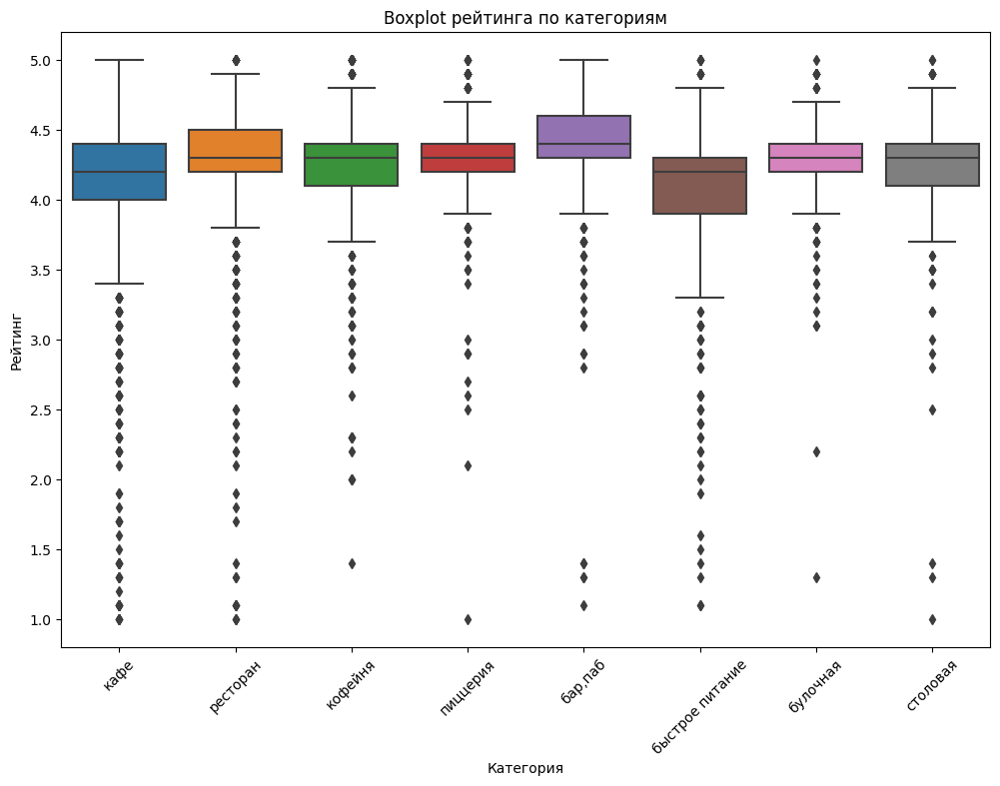

In [48]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=data, x='category', y='rating')
plt.xticks(rotation=45)
plt.title('Boxplot рейтинга по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

Разброс рейтингов в категории мал, медианы близки, медианы отличаются незначительно

In [49]:
category_stats = data.groupby('category')['rating'].agg(['mean', 'std'])
print(category_stats)

                     mean       std
category                           
бар,паб          4.387712  0.380143
булочная         4.268359  0.386303
быстрое питание  4.050249  0.560949
кафе             4.123886  0.566081
кофейня          4.277282  0.372250
пиццерия         4.301264  0.336162
ресторан         4.290446  0.413239
столовая         4.211429  0.454205


Мы можем заметить, что средние значения рейтингов отличаются, но также можно заметить, что стандартное отклонение для каждой категории также отличается. Это может указывать на то, что в разных категориях заведений есть разная дисперсия в оценках, и потому нужно более детально изучить данные и провести статистические тесты, чтобы сделать более точные выводы. Нужно нам это? вроде нет

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [50]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239866
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [51]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/content/drive/MyDrive/csv/admin_level_geomap.geojson'


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423


# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг непосредственном центре Москвы. Самый слабый рейтинг ЮВ адм округ

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [52]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [53]:
street_category_count = data.pivot_table(
    index='street',
    columns='category',
    values='name',
    aggfunc='count',
    fill_value=0
)
street_category_count = street_category_count.assign(total=street_category_count.sum(axis=1)).sort_values(by= 'total',ascending=False).head(15)
street_category_count

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект Мира,12,4,21,53,36,11,45,2,184
Профсоюзная улица,6,4,15,35,18,15,26,3,122
проспект Вернадского,7,1,12,25,16,12,33,2,108
Ленинский проспект,10,3,2,26,23,5,33,5,107
Ленинградский проспект,15,4,2,12,25,9,25,3,95
Дмитровское шоссе,6,2,10,23,11,8,24,4,88
Каширское шоссе,2,0,10,20,16,5,19,5,77
Варшавское шоссе,6,0,7,18,14,4,20,7,76
Ленинградское шоссе,5,2,5,13,13,3,26,3,70


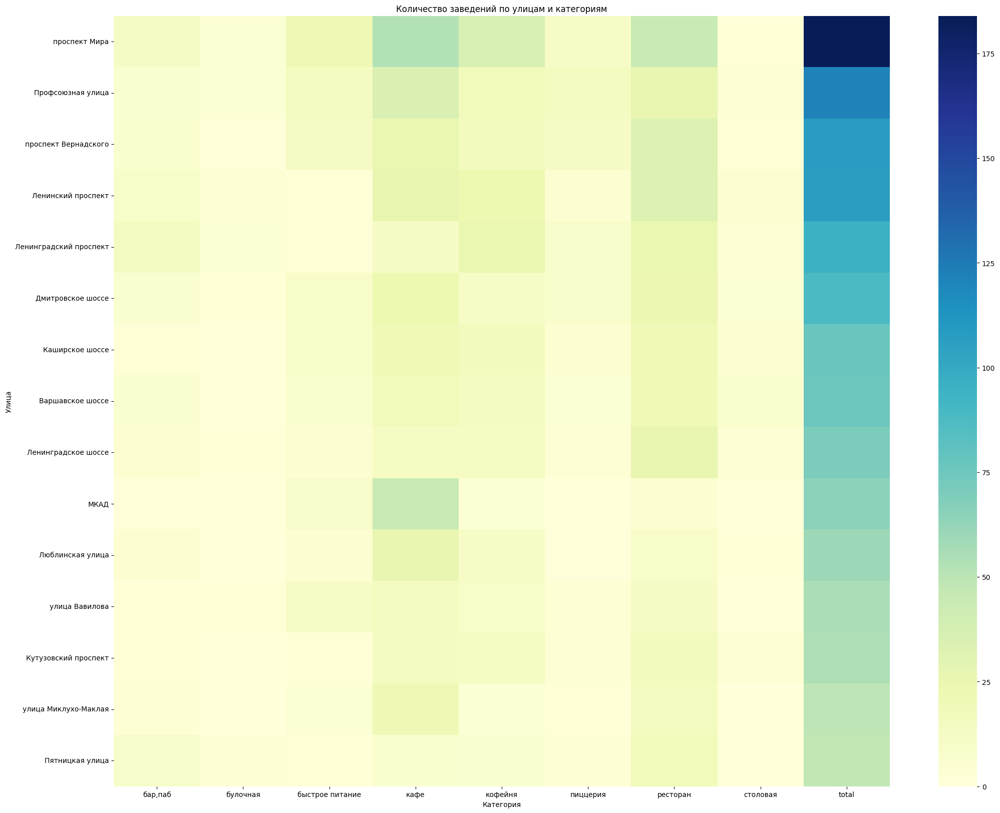

In [54]:
# Создаем сводную таблицу с количеством заведений по улицам и категориям
#pivot = street_category_count.pivot_table(index='street', columns='category', values='name', aggfunc='count').head(15)

# Рисуем тепловую карту
plt.figure(figsize=(25, 20))
sns.heatmap(street_category_count, cmap='YlGnBu')
plt.title('Количество заведений по улицам и категориям')
plt.xlabel('Категория')
plt.ylabel('Улица')
plt.show()

Мира Профсоюзная Вернадского топ улиц из топа 15 и на этих улицах пробладают категории Кафе,Кафе,Ресторан соотетственно

#Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [55]:
#Выводим список улиц с 1 заведением на ней
street_alone=data['street'].value_counts()
street_alone=street_alone[street_alone ==1].index.tolist()
street_alone

['2-я Рощинская улица',
 'Липецкая улица (дублёр)',
 'улица Речников',
 'Дербеневская улица',
 '4-й Воробьёвский проезд',
 'проезд Донелайтиса',
 '1-й Дербеневский переулок',
 'Новороссийская улица',
 'Прибрежный проезд',
 'Талдомская улица',
 'Андреевский пешеходный мост',
 '3-я Фрунзенская улица',
 'Дендропарковая улица',
 '1-й Щипковский переулок',
 '2-й Верхний Михайловский проезд',
 'улица Артюхиной',
 'проспект Лихачёва',
 'Ступинский проезд',
 'улица Стасовой',
 'Задонский проезд',
 'Гурьевский проезд',
 'улица Бусиновская Горка',
 'Весёлая улица',
 'парк Дружбы',
 'Воробьёвская набережная',
 'улица Шкулёва',
 'Пронская улица',
 'улица Самеда Вургуна',
 'Булатниковский проезд',
 '1-я Стекольная улица',
 '3-й Михалковский переулок',
 'улица Васильцовский Стан',
 '2-й Рощинский проезд',
 'Кузьминская улица',
 '3-й проезд Перова Поля',
 'парк Тюфелева роща',
 'Загорьевский проезд',
 'Бесединское шоссе',
 'Жуков проезд',
 'улица Фотиевой',
 'Коломенская набережная',
 '1-й Вешняковск

In [56]:
#Узнаем к каким районам относятся эти улицы
df = data.groupby('street')['name'].nunique() # считаем количество заведений на улице
df = df[df == 1] # выбираем улицы с одним заведением
df = data[data['street'].isin(df.index)] # фильтруем исходный датафрейм по улицам с одним заведением
df_alone = df.groupby('district')['street'].nunique().sort_values() # считаем количество улиц с одним заведением в каждом районе
df_alone

district
Юго-Западный административный округ         18
Северо-Западный административный округ      19
Западный административный округ             35
Юго-Восточный административный округ        39
Южный административный округ                43
Восточный административный округ            53
Северный административный округ             53
Северо-Восточный административный округ     55
Центральный административный округ         145
Name: street, dtype: int64

Районы с наибольшим количеством улиц с количеством заведений не более 1 это Центральный административный округ в Юго-Западный административный округ таких улиц всего 18

In [57]:
# выбираем улицы с одним заведением
one_place_streets = data.groupby('street')['name'].nunique().eq(1)
df_filtered = data.loc[data['street'].isin(one_place_streets[one_place_streets].index)]

# создаем пивот таблицу
pivot_table_one = df_filtered.pivot_table(index='district', columns='street', values='name', aggfunc='count', fill_value=0)
pivot_table_one

street,1-й Автозаводский проезд,1-й Балтийский переулок,1-й Варшавский проезд,1-й Вешняковский проезд,1-й Голутвинский переулок,1-й Грайвороновский проезд,1-й Дербеневский переулок,1-й Земельный переулок,1-й Капотнинский проезд,1-й Кирпичный переулок,...,улица Уткина,улица Фадеева,улица Фотиевой,улица Чечулина,улица Чистова,улица Шкулёва,улица Шкулёва 4,улица Шухова,улица Юннатов,№ 7
district,,,,,,,,,,,,,,,,,,,,,
Восточный административный округ,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0
Западный административный округ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Северный административный округ,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Северо-Восточный административный округ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Северо-Западный административный округ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Центральный административный округ,0,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
Юго-Восточный административный округ,0,0,0,1,0,1,0,0,1,0,...,0,0,0,0,1,1,1,0,0,0
Юго-Западный административный округ,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Южный административный округ,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,1


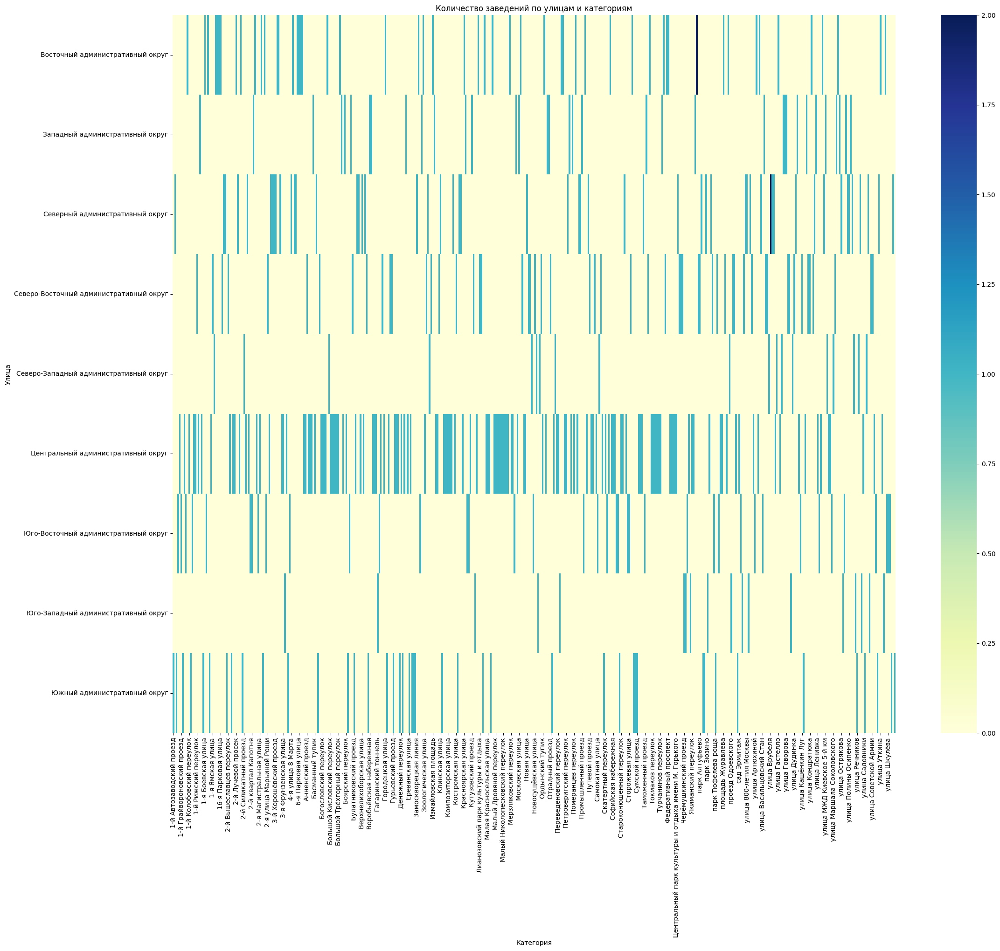

In [58]:

# Рисуем тепловую карту
plt.figure(figsize=(25, 20))
sns.heatmap(pivot_table_one, cmap='YlGnBu')
plt.title('Количество заведений по улицам и категориям')
plt.xlabel('Категория')
plt.ylabel('Улица')
plt.show()

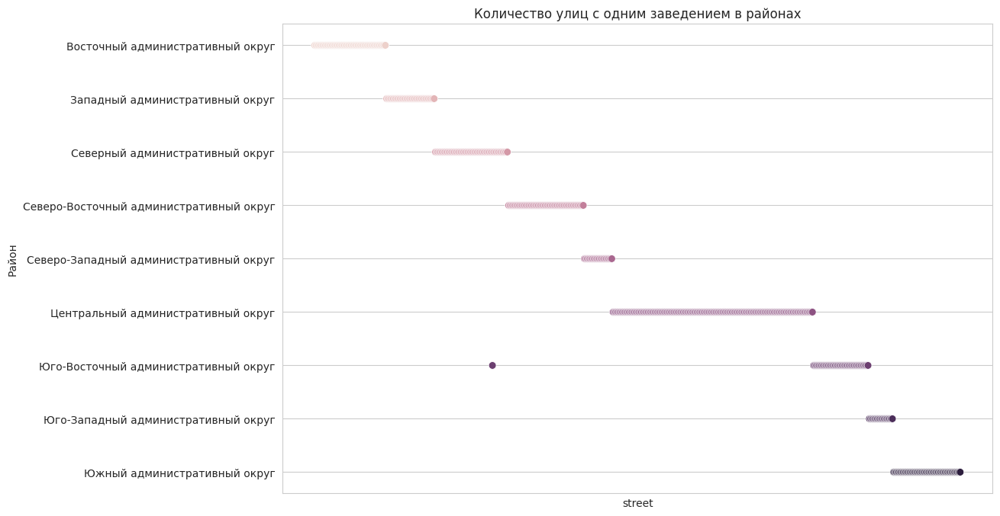

In [59]:

# создаем датафрейм с количеством заведений на каждой улице в районе
df = data.groupby(['district', 'street'], as_index=False)['name'].nunique()
df = df[df['name'] == 1]  # оставляем только улицы с одним заведением

# создаем словарь с цветами для каждого района
color_dict = {district: i for i, district in enumerate(df['district'].unique())}

# добавляем столбец с цветом
df['color'] = df['district'].apply(lambda x: color_dict[x])

# создаем scatter plot
sns.set_style("whitegrid")
plt.figure(figsize=(12,8))
sns.scatterplot(data=df, x='street', y='district', hue='color', size='name', sizes=(50,500), legend=False)
plt.title('Количество улиц с одним заведением в районах')
#plt.xlabel('Улица')
plt.ylabel('Район')
# убираем обозначения улиц на оси x
plt.xticks([])
plt.show()


Везде район лидер с одинокими улицами отображен Центральный Административный округ. Район в котором мало таких улиц с одним заведением на улице это Северозападный и Югозападные адм округа

In [60]:
gpdf = df.pivot_table(
    index='district',
    values='name',
    aggfunc='sum'
).reset_index()
gpdf

,district,name
0,Восточный административный округ,53
1,Западный административный округ,36
2,Северный административный округ,54
3,Северо-Восточный административный округ,56
4,Северо-Западный административный округ,21
5,Центральный административный округ,148
6,Юго-Восточный административный округ,42
7,Юго-Западный административный округ,18
8,Южный административный округ,50


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Восточный административный округ'),
  Text(1, 0, 'Западный административный округ'),
  Text(2, 0, 'Северный административный округ'),
  Text(3, 0, 'Северо-Восточный административный округ'),
  Text(4, 0, 'Северо-Западный административный округ'),
  Text(5, 0, 'Центральный административный округ'),
  Text(6, 0, 'Юго-Восточный административный округ'),
  Text(7, 0, 'Юго-Западный административный округ'),
  Text(8, 0, 'Южный административный округ')])

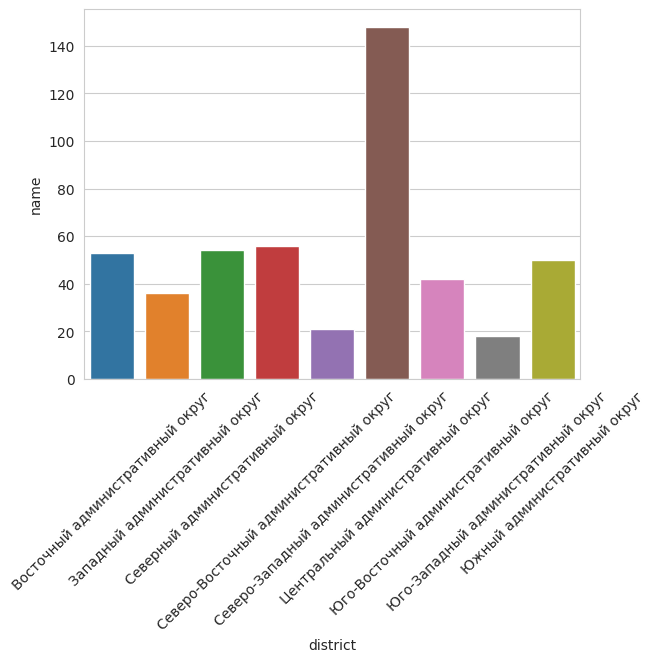

In [102]:
sns.barplot(data=gpdf, x='district', y='name', )
plt.xticks(rotation=45)

In [62]:
#Создадим таблицу с общим количеством улиц порайону
df_count_all = data.groupby('district')['name'].count()
df_count_all

#Создадим список районо с количеством единственных заведений на 1 улице
df_alone=df_alone.sort_index()
df_alone
df_alone=df_alone.rename({'street': 'district'})
df_alone

#Объеденим эти 2два сериаса и переименуем столбцы All это все заведения Alone это количесттво заведение не более 1 на улице
df_merge = pd.concat([df_alone, df_count_all], axis=1)
#df_merge.info()
df_merge=df_merge.rename(columns={'street': 'alone', 'name': 'all'})
df_merge

#Выведем с толбце % соотношение обещего количества заведений к количеству заведений единственным на улице , относителньо районов
df_merge['%'] = df_merge.apply(lambda row: row['alone'] / row['all'], axis=1)#.sort_values(by='%')
df_merge.sort_values('%',ascending=False)

,alone,all,%
district,,,
Восточный административный округ,53,798,0.066416
Центральный административный округ,145,2242,0.064674
Северо-Восточный административный округ,55,891,0.061728
Северный административный округ,53,898,0.059020
Юго-Восточный административный округ,39,714,0.054622
Южный административный округ,43,892,0.048206
Северо-Западный административный округ,19,409,0.046455
Западный административный округ,35,851,0.041128
Юго-Западный административный округ,18,709,0.025388


В относительных цифрах лидером стал Восточный адм округ, но Централььнй Административный округ так же на 2 месте в относительных показателях/ Но везде разница не критичная

#Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [63]:
#Выведем медианный средний чек по каждому району
df_middle_bill = data.groupby('district')['middle_avg_bill'].median().to_frame()
df_middle_bill = df_middle_bill.reset_index()
df_middle_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Средний чек больше в районах Западный административный округ и Центральный административный округ , минимальный в Юго-Восточный административный округ

In [64]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_middle_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

Средний чек наблюдается выше по пути от аэропорта до центра

Как удалённость от центра влияет на цены в заведениях? Тут не понял нужно цена заведений анализировать или всетаки имеется ввиду цены заведений это средний чек!?middle_avg_bill

In [65]:
#Выведем категорийный price по каждому району
df_middle_price = data.groupby(['price','district'])['name'].count().sort_values(ascending= False).reset_index().rename(columns={'name': 'count'})
df_middle_price

,price,district,count
0,средние,Центральный административный округ,666
1,высокие,Центральный административный округ,271
2,выше среднего,Центральный административный округ,240
3,средние,Северо-Восточный административный округ,229
4,средние,Северный административный округ,228
5,средние,Южный административный округ,219
6,средние,Западный административный округ,177
7,средние,Восточный административный округ,169
8,средние,Юго-Западный административный округ,168
9,средние,Юго-Восточный административный округ,153


Центральный административный округ обладатель средними высокими и выше срендего ценовыми категориями, причем средние представлены с огромным отрывов в 3 раза от следующей ценовой категории по количеству представленных заведений в районе

#Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [68]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239866
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


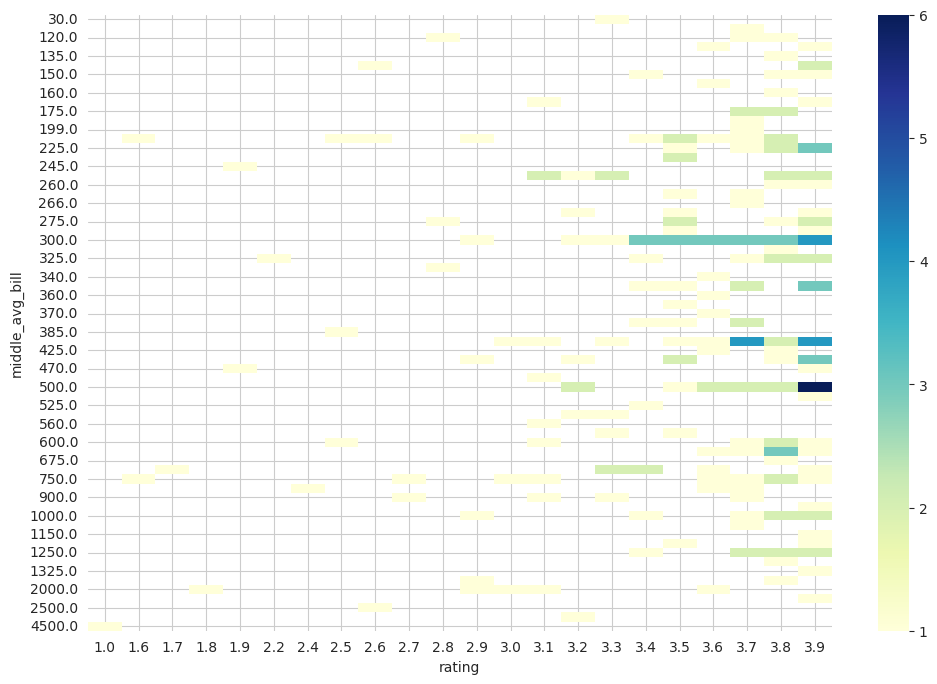

In [69]:
# создаем сводную таблицу
pivot_rating = pd.pivot_table(data=data[data['rating']< 4],
                       index='middle_avg_bill',
                       columns='rating',
                       values='name',
                       aggfunc='count')

# выводим сводную таблицу
pivot_rating
# строим тепловую карту
plt.figure(figsize=(12,8))
sns.heatmap(pivot_rating, cmap='YlGnBu');

Средний чек в районе 300 гарантирует плохие оценки) от 3.4 до 3.9


Вывод по разделу: Мы имеем 8 уникальных категорий обепита.Самыми популярными по количеству заведений в категории являбтся КАФЕ РЕСТОРАН КОФЕЙНЯ, А аутсайдеры БУЛОЧНЫЕ И СТОЛОВЫЕ В параметрах посадочные места были аномалии,мы их заменили на медианне значения категории. И получили выводы по посадочным местам на 1мместе РЕСТОРАН,2м БАР ПАБ, 3,4 КОФЕЙНЯ и СТОЛОВАЯ. в БУЛОЧНЫХ меньше всех мест Из всех заведений 38.1% толкьо сетевые,несетевых в 2 раза больше Среди сетевых на 1м месте по количеству заведений ШОКОЛАДНИЦА, Доминоспицца, Додопицца Категории кофейня и пиццерия имеют почти одинаковое соотношение сетевыъ к несетевым,а вот в булочнх сетевые пробладают на несетевыми В сетевых заведениях самая популярная категория это кофеня, потом ресторан и пиццерия.

Районов в датасете 9 штук, самый популярный район это ЦАО ,самый не поупулярный это Северозападный адм округ в ЦАО популярные категории относительно других районов это БАР,ПАБ, КАФЕ, КОФЕЙНЯ,РЕСТОРАН Разброс рейтингов от 4.05 до 4.38 Разброс рейтингов в категории мал, медианы близки, медианы отличаются незначительно Средние рейтинги заведений каждого из районов от 4.1 до 4.23 мы имеем 2 явновыраженые улицы лидера. Это 1й Красногрвардейский проезд, на нем лидер категория кафе и ресторан. И улица 1й дорожный проезд,там лидер категория кафе Районы с наибольшим количеством улиц с количеством заведений не более 1 это Центральный административный округ в Юго-Западный административный округ таких улиц всего 18 Средний чек больше в районах Западный административный округ и Центральный административный округ , минимальный в Юго-Восточный административный округ Средний чек наблюдается выше по пути от аэропорта до центра Центральный административный округ обладатель средними высокими и выше срендего ценовыми категориями, причем средние представлены с огромным отрывов в 3 раза от следующей ценовой категории по количеству представленных заведений в районе

#Шаг 4. Детализируем исследование: открытие кофейни

In [70]:
print('В категории кофейня заведеений:',data['category'].count())

В категории кофейня заведеений: 8404


In [71]:
print(data[data['category'] == 'кофейня'].groupby('district')['name'].count().sort_values())
print('')

district
Северо-Западный административный округ      62
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Восточный административный округ           105
Южный административный округ               131
Западный административный округ            150
Северо-Восточный административный округ    159
Северный административный округ            193
Центральный административный округ         428
Name: name, dtype: int64



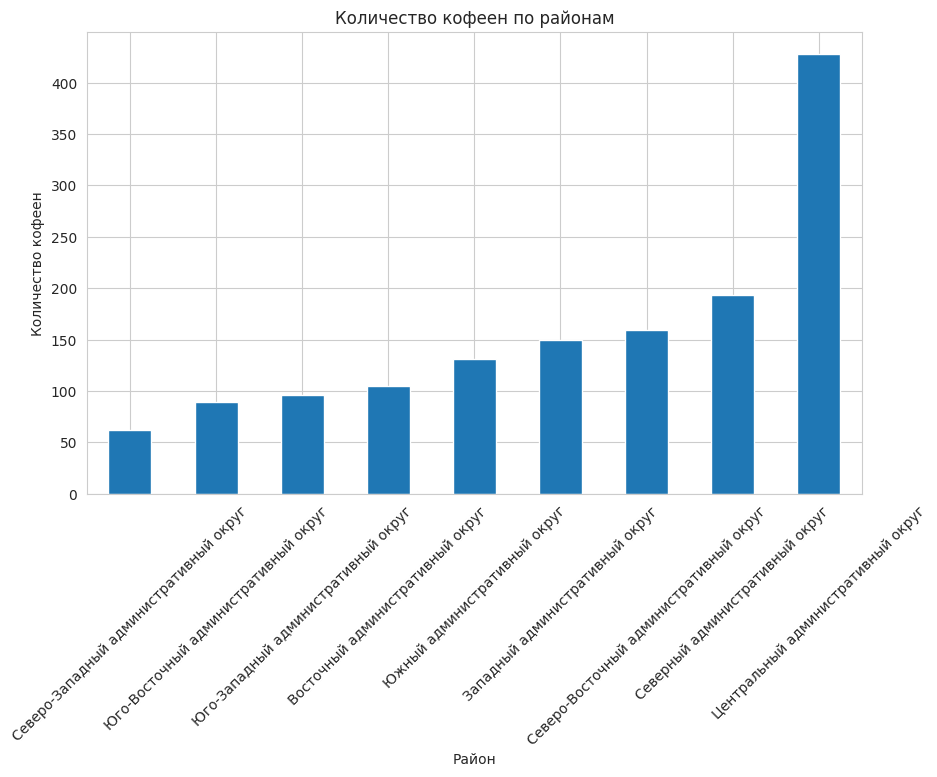

In [72]:
# Группировка данных по районам и подсчет количества кофеен
coffee_count_by_district = data[data['category'] == 'кофейня'].groupby('district')['name'].count().sort_values()

# Построение гистограммы
plt.figure(figsize=(10, 6))
coffee_count_by_district.plot(kind='bar')
plt.title('Количество кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Количество кофеен')
plt.xticks(rotation=45)
plt.show()

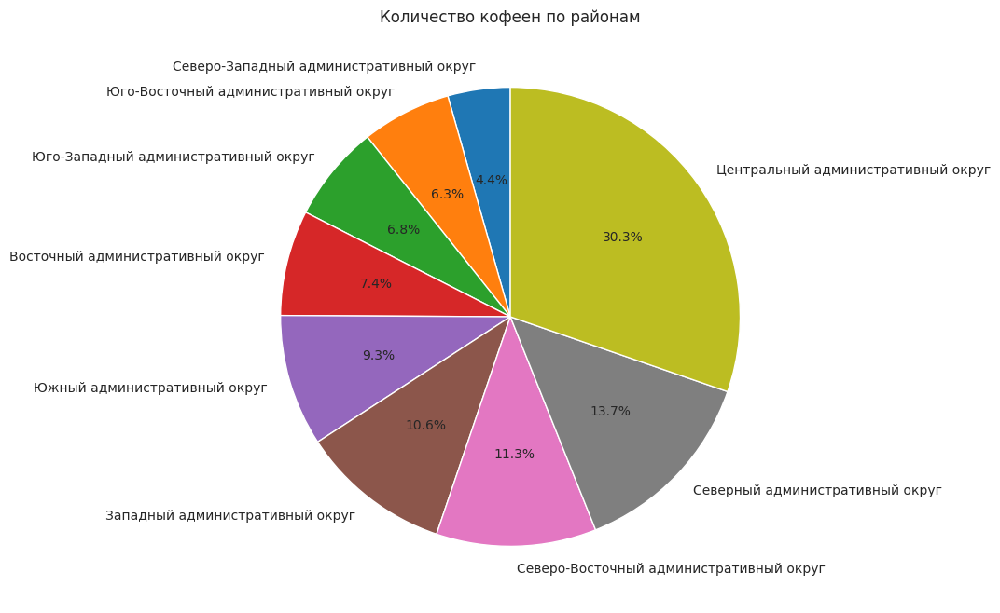

In [73]:
# Построение графика секторов
plt.figure(figsize=(8, 8))
coffee_count_by_district.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Количество кофеен по районам')
plt.ylabel('')
plt.show()

ЦАО самый насыщенный кофейнями,более чем в 2 разаследующего по насыщенности Сев адм округа. Аутсайдер Северозападнй адм округ

In [74]:
print(data[(data['category'] == 'кофейня') & (data['is_24/7'] == True)]['name'].count())
print('Всего круглосуточных кофеен')


59
Всего круглосуточных кофеен


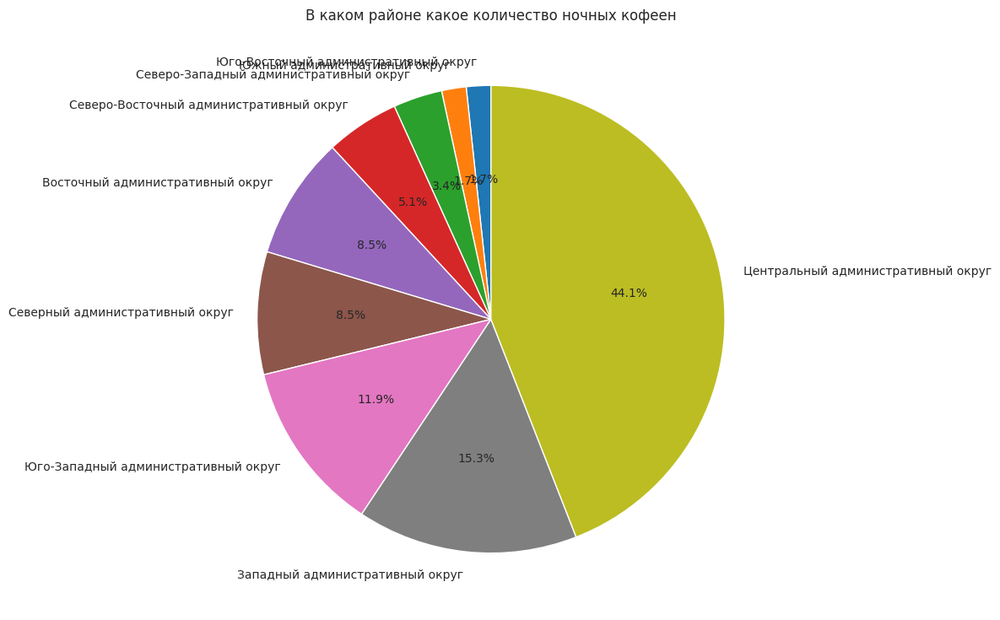

In [75]:
# подсчет количества значений
hour_coffee_count = data[(data['category'] == 'кофейня') & (data['is_24/7'] == True)].groupby('district')['name'].count().sort_values().head(15)
hour_coffee_labels = hour_coffee_count.index.tolist()
# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(hour_coffee_count, labels=hour_coffee_labels, autopct='%1.1f%%', startangle=90)
ax.set_title('В каком районе какое количество ночных кофеен')
plt.show()

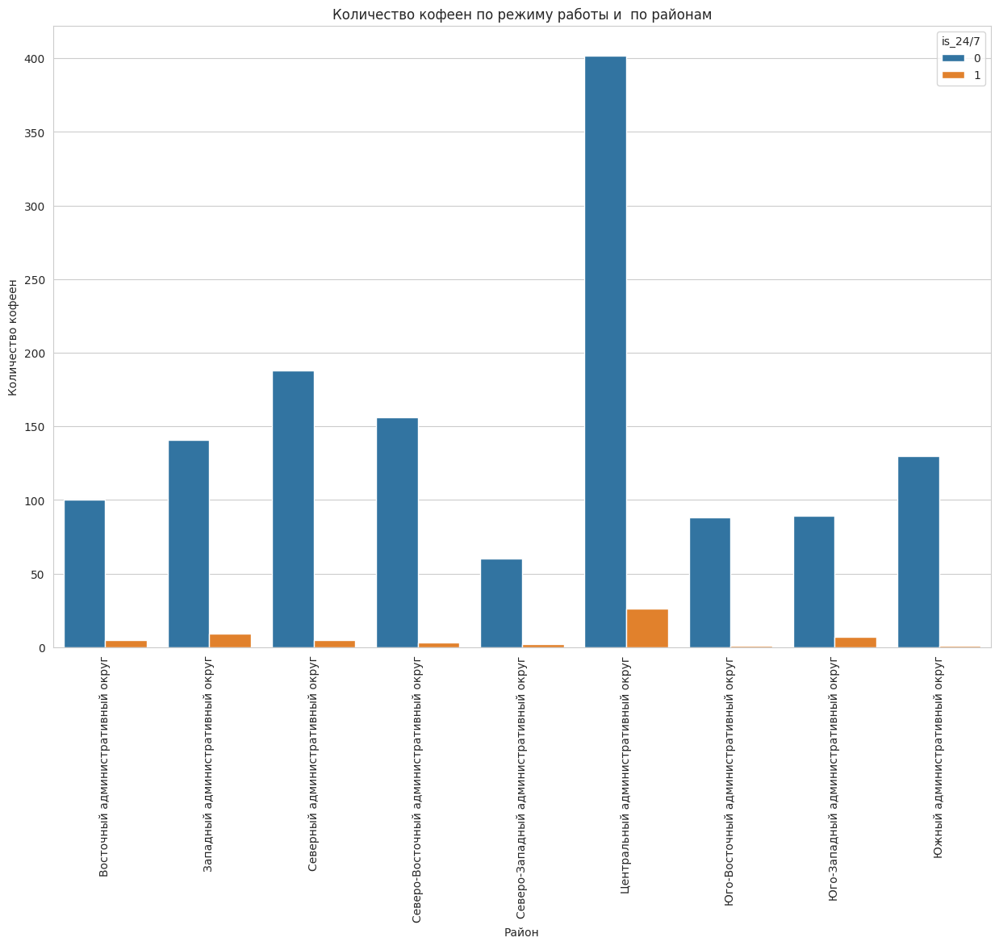

In [76]:
#В каких раонах больше всего кофеен
# создаем таблицу с количеством заведений по районам и по категория
district_count_coffee = data[data['category'] == 'кофейня'].groupby(['district','is_24/7'])['name'].count().reset_index()
district_count_coffee.columns = [ 'district','is_24/7','count']

fig, ax = plt.subplots(figsize=(15,10))
# создаем барплот, разделяя заведения по районам и по режиму работы
sns.barplot(data=district_count_coffee, x='district', y='count', hue='is_24/7')

# задаем название графика и осей
ax.set_title('Количество кофеен по режиму работы и  по районам')
ax.set_xlabel('Район')
ax.set_ylabel('Количество кофеен')
plt.xticks(rotation=90)

plt.show()

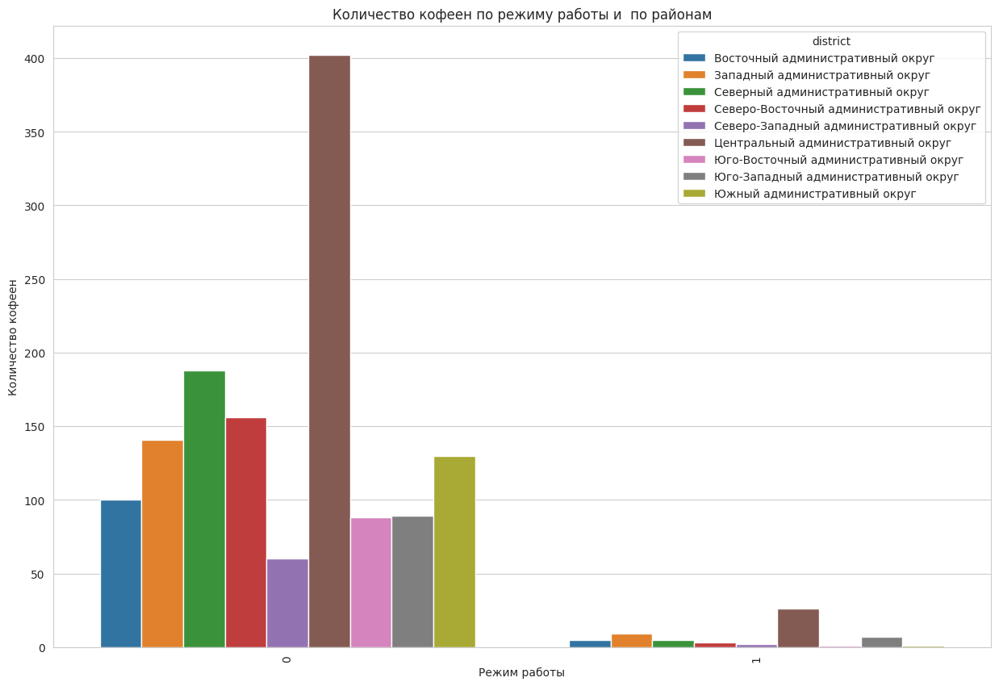

In [77]:
#В каких раонах больше всего кофеен
# создаем таблицу с количеством заведений по районам и по категория
district_count_coffee = data[data['category'] == 'кофейня'].groupby(['is_24/7', 'district'])['name'].count().reset_index()
district_count_coffee.columns = ['is_24/7', 'district', 'count']

fig, ax = plt.subplots(figsize=(15,10))
# создаем барплот, разделяя заведения по районам и по режиму работы
sns.barplot(data=district_count_coffee, x='is_24/7', y='count', hue='district')

# задаем название графика и осей
ax.set_title('Количество кофеен по режиму работы и  по районам')
ax.set_xlabel('Режим работы')
ax.set_ylabel('Количество кофеен')
plt.xticks(rotation=90)

plt.show()

ВЫше 2 графика которые показывают что ночных кофеен значителньо меньше,и знаителньо их больше в ЦАО,в других районах особо не наблюдается потребности. Интересно что ночных кафеен в ЦАО примерно в 2 меньше чем дневных кофеен в Сев-Зап адм. округе

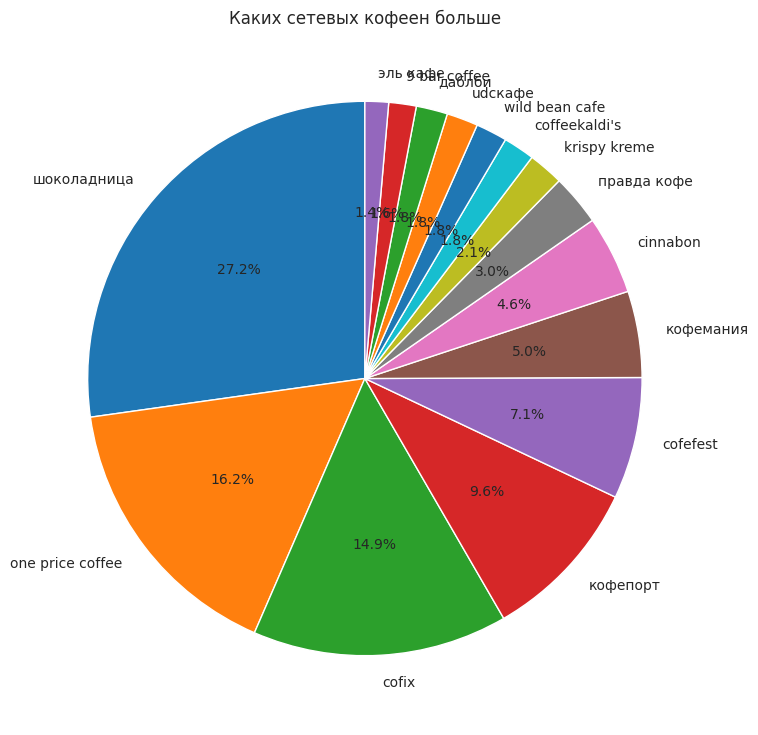

In [78]:
# подсчет количества значений
chain_coffee_count = data[(data['chain']==1) & (data['category'] == 'кофейня')]['name'].value_counts().head(15)
chain_coffee_labels = chain_coffee_count.index.tolist()
# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(chain_coffee_count, labels=chain_coffee_labels, autopct='%1.1f%%', startangle=90)
ax.set_title('Каких сетевых кофеен больше')
plt.show()

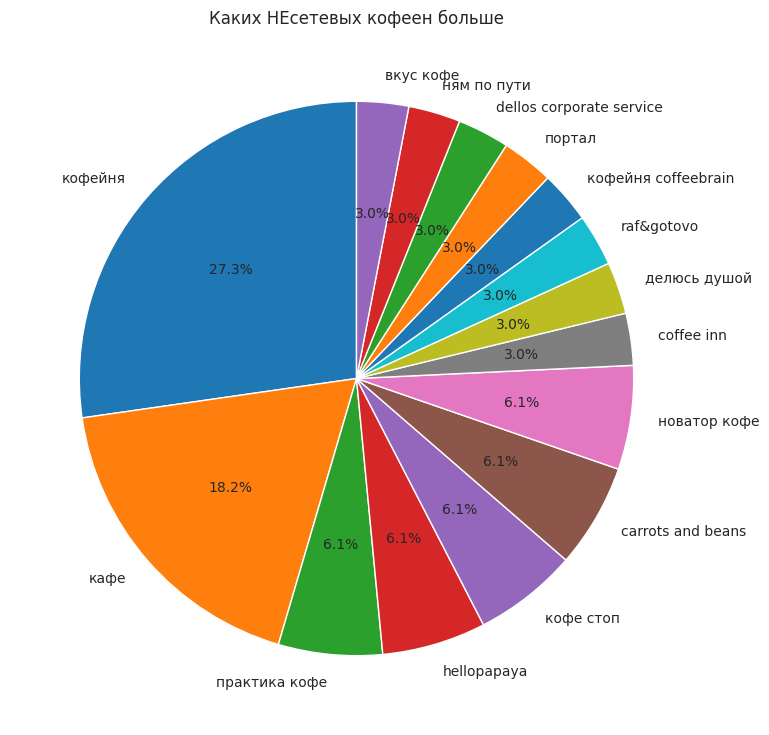

In [79]:
data[(data['chain']==0) & (data['category'] == 'кофейня')]['name'].value_counts()
# подсчет количества значений
no_chain_coffee_count = data[(data['chain']==0) & (data['category'] == 'кофейня')]['name'].value_counts().head(15)
no_chain_coffee_labels = no_chain_coffee_count.index.tolist()
# построение диаграммы
fig, ax = plt.subplots(figsize=(9,9))
ax.pie(no_chain_coffee_count, labels=no_chain_coffee_labels, autopct='%1.1f%%', startangle=90)
ax.set_title('Каких НЕсетевых кофеен больше')
plt.show()

3 лидеров сетевых:Шоколадница, One price coffee, Cofix Лидеры не сетевых с названиями КОФЕЙНЯ, КАФЕ, ВкусВилл, кафе. Думаю названия тут одинаковые но владельцы разные,именно потому они не сетевые

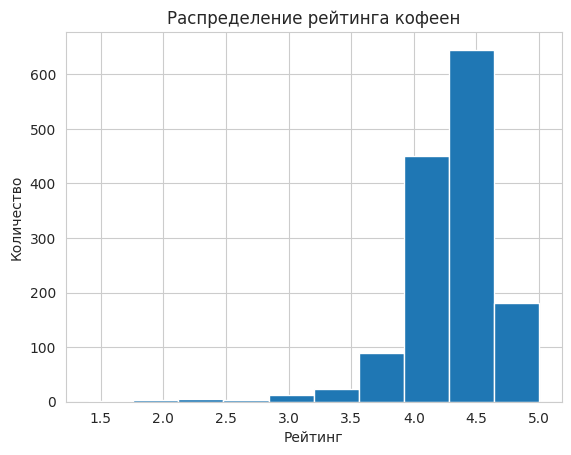

In [80]:
# создаем подгруппу данных для кофеен
coffee_data = data[data['category'] == 'кофейня']

# создаем гистограмму распределения рейтинга кофеен
plt.hist(coffee_data['rating'], bins=10)
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.title('Распределение рейтинга кофеен')
plt.show()


РЕйтинги распреелены нормально и имееют пики в диапазоне 4-4.5

In [81]:
coffee_data['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

coffee_data['rating'].describe()
coffee_data['rating'].describe()
Большинство ресторанов имеют высокий рейтинг (среднее значение близко к максимальному, низкое стандартное отклонение и квартили), хотя есть несколько выбросов в сторону очень низких оценок (минимальное значение 1.4).

In [82]:
pivot_coffee= coffee_data.pivot_table(
    values='rating',
    columns='district',
    aggfunc='mean')
pivot_coffee

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
rating,4.282857,4.195333,4.29171,4.216981,4.325806,4.336449,4.225843,4.283333,4.232824


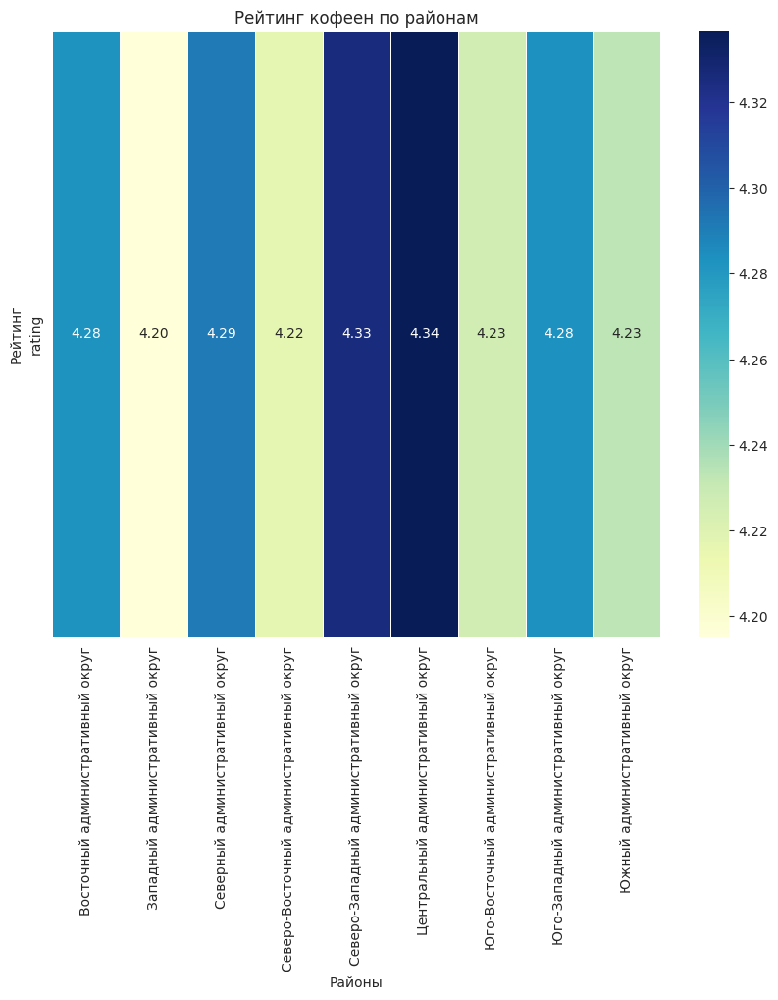

In [83]:
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_coffee, cmap='YlGnBu', annot=True, fmt='.2f', linewidths=.5)
plt.title('Рейтинг кофеен по районам')
plt.xlabel('Районы')
plt.ylabel('Рейтинг')
plt.show()

Выше всего рйтинги у ЦАО и Сев-Зап адм. округ, ниже рейтинги в районе ЗАпадный адм округ

In [84]:
coffee_data['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

в данном случае можно сказать, что среднее значение количества заведений в районе составляет примерно 175, а стандартное отклонение равно 89.753, что говорит о довольно большом разбросе значений. Также можно заметить, что максимальное значение равно 1568, что является выбросом в данных, а медианное значение (50%) находится на уровне 170, что может быть более репрезентативной характеристикой среднего значения.

In [85]:
Q1 = coffee_data['middle_coffee_cup'].quantile(0.25)
Q3 = coffee_data['middle_coffee_cup'].quantile(0.75)
IQR = Q3 - Q1
data_filtered = coffee_data[(coffee_data['middle_coffee_cup'] > (Q1 - 1.5 * IQR)) & (coffee_data['middle_coffee_cup'] < (Q3 + 1.5 * IQR))]
data_filtered

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,town
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,0,Москва
72,лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.891196,37.585653,4.5,средние,Цена чашки капучино:150–190 ₽,NaN,170.0,0,12.0,Алтуфьевское шоссе,0,Москва
81,coffee way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.897789,37.588189,4.3,NaN,Цена чашки капучино:120–170 ₽,NaN,145.0,1,120.0,Алтуфьевское шоссе,0,Москва
89,сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120.0,Дмитровское шоссе,0,Москва
100,take and wake,кофейня,"Москва, Дмитровское шоссе, 100, стр. 2",Северный административный округ,пн-пт 08:30–18:30,55.882019,37.546174,4.5,низкие,Цена чашки капучино:150–210 ₽,NaN,180.0,1,120.0,Дмитровское шоссе,0,Москва
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8335,baer coffee,кофейня,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,пн 00:00–21:00; вт-сб 09:00–21:00; вс 00:00–21:00,55.711757,37.751269,4.4,низкие,Цена чашки капучино:120–180 ₽,NaN,150.0,0,80.0,Окская улица,0,Москва
8342,coffee week,кофейня,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.718199,37.784447,4.3,NaN,Цена чашки капучино:120–220 ₽,NaN,170.0,0,116.0,Рязанский проспект,0,Москва
8348,bonjour,кофейня,"Москва, Шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.689958,37.725969,4.7,средние,Цена чашки капучино:130–190 ₽,NaN,160.0,0,NaN,Шоссейная улица,0,Москва
8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,80.0,Волгоградский проспект,0,Москва


In [86]:
data_filtered['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

data_filtered['middle_coffee_cup'].describe()
Исходя из данных, можно сказать, что среднее значение среднего чека в кофейнях равно примерно 172.38, с стандартным отклонением в 65.77. Минимальное значение - 60, а максимальное - 375, что указывает на достаточно большой разброс данных

In [87]:
mid_cup=data_filtered.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False)
mid_cup

district
Западный административный округ            189.938776
Центральный административный округ         187.518519
Юго-Западный административный округ        184.176471
Северный административный округ            165.789474
Северо-Западный административный округ     165.523810
Северо-Восточный административный округ    165.333333
Южный административный округ               158.488372
Юго-Восточный административный округ       151.088235
Восточный административный округ           140.024390
Name: middle_coffee_cup, dtype: float64

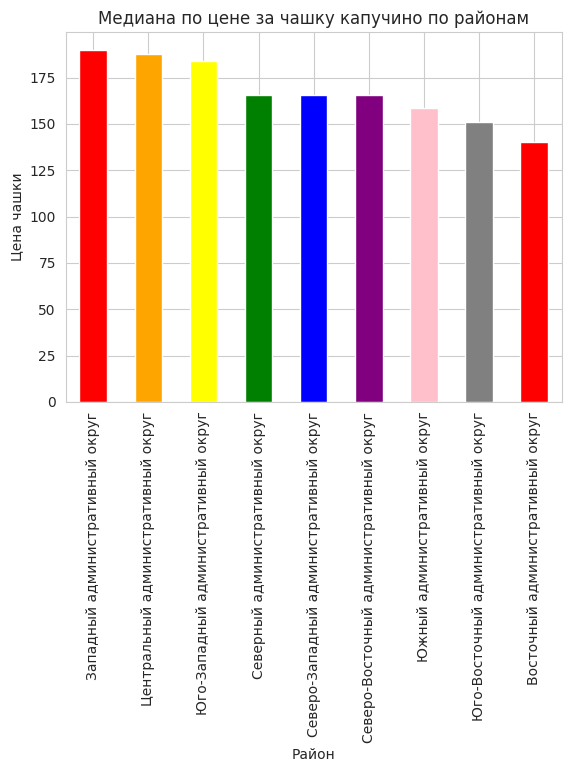

In [88]:
mid_cup.plot.bar(color=['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'pink', 'gray'])
plt.title('Медиана по цене за чашку капучино по районам')
plt.xlabel('Район')
plt.ylabel('Цена чашки')
plt.show()

Я бы предложил ориентироваться на эти цифры стоимости капучино,в зависимости отрайона который нам будет подходить

In [89]:
#Средний чек у ночных заведенией
coffee_data[coffee_data['is_24/7']==1].groupby('district')['middle_avg_bill'].mean()

district
Восточный административный округ            400.000000
Западный административный округ            1675.000000
Северный административный округ                    NaN
Северо-Восточный административный округ            NaN
Северо-Западный административный округ      750.000000
Центральный административный округ         1555.555556
Юго-Восточный административный округ               NaN
Юго-Западный административный округ                NaN
Южный административный округ                       NaN
Name: middle_avg_bill, dtype: float64

Много нанов, даже незнаю стоит ли искать и заменять что то!?

In [90]:
#Средний рейтинг у ночных заведений по районам
coffee_data[coffee_data['is_24/7']==1].groupby(['district','rating'])['middle_avg_bill'].mean()

district                                 rating
Восточный административный округ         4.0          NaN
                                         4.1          NaN
                                         4.2        400.0
                                         5.0          NaN
Западный административный округ          3.8          NaN
                                         4.1          NaN
                                         4.2          NaN
                                         4.3       1100.0
                                         4.4       2250.0
Северный административный округ          3.5          NaN
                                         4.0          NaN
                                         4.2          NaN
                                         4.7          NaN
Северо-Восточный административный округ  3.1          NaN
                                         4.0          NaN
                                         4.5          NaN
Северо-Западный админист

#Вывод:

Для открытия кофейни стоит выбирать ЦАО , Рассматривать либо варианты ил улиц на которых нету заведений общепита либо которые топ-15 по численности таких. Средний чек за капучино делать не менее медианного по району 187р. Если открываться в ЦАО то есть смысл в будущем подумать над ночным режимом работы,но толкоь в этом районе это актуально

ПРЕЗЕНТАЦИЯ
Презентация: Ссылка на гугл диск https://docs.google.com/presentation/d/1fm-PEvzSMHuQdG2_6Kk02dD1YSmJ_UqDMOItIXCXmO4/edit?hl=ru#slide=id.g245e791ddb1_2_35